# Thesis
***

## Aspect BASED Sentiment Analysis
***
***

### Project Lifecycle 

* 1. Problem Statsement

* 2. Data Collection 

* 3. EDA

* 4. Machine Learning Approach

* 5. Result validation and Report

## Load Formatted Data

### Import library

In [20]:
import numpy as np
import pandas as pd
import re
import time
import seaborn as sns
import matplotlib.pyplot as plt
import pickle
from umap import UMAP
import plotly.express as px


import nltk
from nltk.tokenize import sent_tokenize, word_tokenize
from collections import defaultdict
import spacy
from tqdm import tqdm
from collections import Counter
from nltk.stem import WordNetLemmatizer
  

import datapurifier as dp
from datapurifier import Mleda, Nlpeda, Nlpurifier, MlReport
from datapurifier import NLAutoPurifier

In [8]:
df = pd.read_csv('formatted_df.csv')

In [9]:
print(df.shape)

(49895, 5)


In [10]:
df.sample(2)

,industry,location_name,location_uid,comment,comment_num_words
2292,automotive-dealer,Member Loyalty - US,3603702,Onstar service representative was very helpful...,49.0
15851,automotive-dealer,Member Loyalty - US,3603702,OnStar would work for us if we could purchase ...,51.0


In [11]:
# Load the Final dict of aspects
with open("final_aspects_list.pkl", "rb") as tf:
    final_aspects_list = pickle.load(tf)
    
# Get all the aspect's seed words
all_aspects = []
for aspects in final_aspects_list.values():
    all_aspects.extend(aspects)
    
reverese_aspect_dict = {}
for key, aspect_term_list in list(final_aspects_list.items()):
    for aspect_term in aspect_term_list:
        reverese_aspect_dict[f"{aspect_term}"]=key
        

# 4. Machine Learning Approach

Ref Paper: https://ieeexplore.ieee.org/document/9279217

* 4.1 Aspect Extraction  
* 4.2 Aspect Detection
* 4.3 Aspect's Sentiment detection

## 4.2 Aspect Detection

* Split the reviews into sentences
* Find the cosine similarity b/w sentence and aspect terms
* Assign the closest aspect to the sentence if similarity score is greater than the threshold.

In [26]:
# Review Sample
whole_sent = """I have been a customer for 22 years, mostly with 2 vehicles, you had the best thing since cotton candy, something nobody
else has, and now upper management has totally blown it, at least for me, maybe others want to buy a flogged horse, not
me I am done. Yes I have a cell phone, I am disabled, but some places I go they don't always work, and Onstar has always
had my back, it always worked, just as I needed. Now some goofball, says no more phone, so what does $320.00/year get me,
remote door unlock, remote start (it's already on my keychain), call for a hook (member of AAA for 47years) make restaurant
& hotels reservations WOW, air bag deployment GREAT, accident detection GREAT, emergency response GREAT. That's it, this is not for me, too much $$$, too little use, you already took over 200 minutes from my GMC Sierra 3500HD Crew Cab, and shut it down, tomorrow you will take 728 minutes from my Traverse LTZ and shut it down also. I wouldn't reccomend Onstar to my Ex-wife, and I had nothing but praise all these years, this is my first negative about Onstar, even having to pay for an upgrade to equiptment in my truck, it worked, and I was happy. Nope Onstar is not for me now, won't reccomend.
"""

In [36]:
# Review Sample
print('Before: ')
print(whole_sent)
print('*'*100)

print('After: ')
for idx, sent in enumerate(sent_tokenize(whole_sent)):
    print(f"{idx+1}:  {sent}")

Before: 
I have been a customer for 22 years, mostly with 2 vehicles, you had the best thing since cotton candy, something nobody
else has, and now upper management has totally blown it, at least for me, maybe others want to buy a flogged horse, not
me I am done. Yes I have a cell phone, I am disabled, but some places I go they don't always work, and Onstar has always
had my back, it always worked, just as I needed. Now some goofball, says no more phone, so what does $320.00/year get me,
remote door unlock, remote start (it's already on my keychain), call for a hook (member of AAA for 47years) make restaurant
& hotels reservations WOW, air bag deployment GREAT, accident detection GREAT, emergency response GREAT. That's it, this is not for me, too much $$$, too little use, you already took over 200 minutes from my GMC Sierra 3500HD Crew Cab, and shut it down, tomorrow you will take 728 minutes from my Traverse LTZ and shut it down also. I wouldn't reccomend Onstar to my Ex-wife, and I h

In [39]:
%%time

# Split the reviews into sent
sentence = []
location_id = []
for idx, text in tqdm(enumerate(df['comment'])):
    for s in sent_tokenize(text):
        sentence.append(s)
        location_id.append(df['location_uid'].iloc[idx])

49895it [00:03, 14115.28it/s]

Wall time: 3.54 s


In [42]:
# Create a new dataframe
sentences_df = pd.DataFrame({'location_id':location_id,  'sentences': sentence})

In [43]:
# sample
print(f'Total sentences: {len(sentences_df)}')
sentences_df.sample(2)

Total sentences: 100295


,location_id,sentences
28166,3603735,Roadside took care of it after a few calls
59106,3603738,She was very helopful & well informed.


In [44]:
# Clean sentences
from texthero import preprocessing
import texthero as hero

custom_pipeline = [
    preprocessing.lowercase,
    preprocessing.remove_whitespace,
    preprocessing.remove_digits,
    preprocessing.remove_punctuation,
    preprocessing.remove_whitespace
]

sentences_df['clean_sentences'] = hero.clean(sentences_df['sentences'], custom_pipeline)

In [45]:
# Keeping only those sentences where word length is greater than 5
sentences_df = sentences_df[sentences_df['clean_sentences'].apply(lambda x : len(x.split()))>5]
sentences_df.shape

(76545, 3)

In [46]:
# Reset the index
sentences_df = sentences_df.reset_index(drop=True)
sentences_df['ind'] = sentences_df.index

In [47]:
sentences_df.head(2)

,location_id,sentences,clean_sentences,ind
0,3603702,The representative that helped me was amazing.,the representative that helped me was amazing,0
1,3603702,"She was kind, professional and went over and b...",she was kind professional and went over and be...,1


#### Assigning aspects

Refer: https://github.com/UKPLab/sentence-transformers

In [49]:
%%time
# Assigning aspects

from sentence_transformers import SentenceTransformer, util

model = SentenceTransformer('all-MiniLM-L6-v2')

sentences_df['aspect'] = None
sentences_df['aspect_score'] = None
sentences_df['aspect_seed_word'] = None

aspect_embeddings = model.encode(all_aspects, convert_to_tensor=False)

sent_embedding = model.encode(sentences_df['clean_sentences'].values, convert_to_tensor=False)
cosine_scores = util.cos_sim(sent_embedding, aspect_embeddings)

aspect_index = np.argmax(cosine_scores, axis=1)

aspect_seed_word  = list((np.array(all_aspects)[aspect_index]))
aspect = [reverese_aspect_dict[key] for key in list((np.array(all_aspects)[aspect_index]))]
aspect_score = [s[aspect_index[idx]] for idx, s in enumerate(cosine_scores)]



Wall time: 22.4 s


In [50]:
sentences_df['aspect'] = aspect
sentences_df['aspect_score'] = np.array(aspect_score)
sentences_df['aspect_seed_word'] = aspect_seed_word

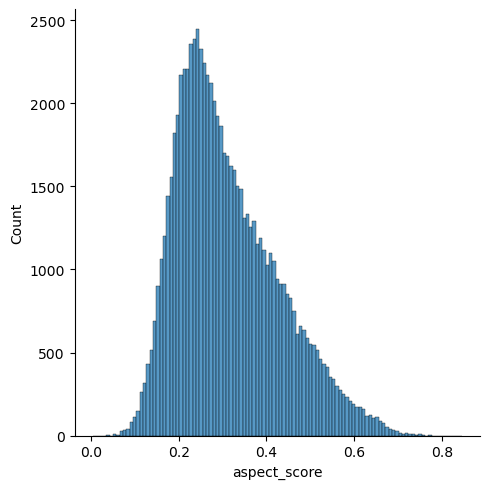

In [52]:
# Distribution plot of aspect_score
sns.displot(sentences_df['aspect_score'])
plt.show()

In [53]:
len(aspect_seed_word), sentences_df.shape, len(aspect), len(aspect_score)

(76545, (76545, 7), 76545, 76545)

In [54]:
sentences_df.head(5)

,location_id,sentences,clean_sentences,ind,aspect,aspect_score,aspect_seed_word
0,3603702,The representative that helped me was amazing.,the representative that helped me was amazing,0,ADMINISTRATION,0.604803,representative
1,3603702,"She was kind, professional and went over and b...",she was kind professional and went over and be...,1,EXPERIENCE,0.302708,experience
2,3603708,Los recomendaría con otras personas que compre...,los recomendaría con otras personas que compre...,2,SALES,0.393466,dealer
3,3603738,I did not have any problems - I renewed my Pro...,i did not have any problems i renewed my prote...,3,SERVICE,0.224744,provider
4,3603738,Let my coverage without notice expire then tri...,let my coverage without notice expire then tri...,4,FINANCE,0.215077,billing


In [55]:
# Value counts of each aspect
sentences_df['aspect'].value_counts()

SERVICE           26817
CUSTOMER          10218
PRICING            9609
SALES              9454
ADMINISTRATION     8352
FINANCE            5497
COMPETENCE         3527
EXPERIENCE         3071
Name: aspect, dtype: int64

#### Analysing the aspect based on aspect score


In [57]:
pd.set_option('display.max_columns', 999)
pd.set_option('display.max_rows', 1500)
pd.set_option('display.max_colwidth', None)

In [69]:
aspect_category = 'SERVICE'
sentences_df[['sentences','aspect','aspect_score','aspect_seed_word']][
    sentences_df['aspect']==aspect_category].sort_values('aspect_score', ascending=True).iloc[0:1000]

,sentences,aspect,aspect_score,aspect_seed_word
32117,"As the way it works now, you have to have the app open on the iPhone which makes it useless to use on the Apple Watch.",SERVICE,0.041128,provider
49584,The layout should be available if iPhone/iPad position is landscape,SERVICE,0.050666,assistance
72007,It would be great if you could set the temp when you start it up.,SERVICE,0.053693,system
47637,Checked to see if there was any diagnostic notification regarding a problem I had but it wasn't showing up.,SERVICE,0.055094,provider
33711,Data and cache have to be manually cleared every time to force it to connect to the login server.,SERVICE,0.056428,service
72245,"After researching online, I deleted then reinstalled the app and it seems to be working again.",SERVICE,0.059660,service
9307,Should only need to login 1 time opening the app.,SERVICE,0.067578,provider
45282,Each time that I log in I have to close the app and immediately reopen it to get it to load.,SERVICE,0.068570,service
17352,Not updating no remote for locking starting location,SERVICE,0.069374,service
18100,The issue eventually resolved itself but I am very dissapointed that it happened in the first place because of a call from onstar.,SERVICE,0.070157,provider


In [102]:
# Label all the sentence as Miscellaneous
low_score_index = sentences_df[sentences_df['aspect_score']<0.25].index

sentences_df.at[low_score_index, 'aspect'] = 'MISCELLANEOUS'

In [103]:
# Value counts of each aspect
sentences_df['aspect'].value_counts()

MISCELLANEOUS     27219
SERVICE           17181
PRICING            6694
ADMINISTRATION     6677
CUSTOMER           6551
SALES              5783
FINANCE            3663
COMPETENCE         1532
EXPERIENCE         1245
Name: aspect, dtype: int64

In [104]:
# Save the aspect df
sentences_df.to_csv('sentence_aspect_df.csv', index= False)

In [105]:
sentences_df.head(2)

,location_id,sentences,clean_sentences,ind,aspect,aspect_score,aspect_seed_word
0,3603702,The representative that helped me was amazing.,the representative that helped me was amazing,0,ADMINISTRATION,0.604803,representative
1,3603702,"She was kind, professional and went over and beyond what I had expected!",she was kind professional and went over and beyond what i had expected,1,EXPERIENCE,0.302708,experience


### Cluster isualisation using BERT Embeddings of sentences

In [110]:
# Make a copy of sentences_df
bert_embeddings_df = sentences_df.copy()

In [122]:
# Visualise only those sentence where aspect!=MISCELLANEOUS
non_misc_df = bert_embeddings_df[~(bert_embeddings_df['aspect']=='MISCELLANEOUS')]
non_misc_emb = sent_embedding[non_misc_df['ind'].values]

In [123]:
# UMAP projection visualisation
umap_2d = UMAP(n_components=2, init='random', random_state=0)
proj_2d = umap_2d.fit_transform(non_misc_emb)

non_misc_df['comp_1'] = proj_2d[:,0]
non_misc_df['comp_2'] = proj_2d[:,1]

#### Cluster plot

In [130]:
# Plot 
print('Cluster Visualisation using BERT Embeddings of sentences: ')
fig_2d = px.scatter(
    non_misc_df, x='comp_1', y='comp_2')
fig_2d.show()

Cluster Visualisation using BERT Embeddings of sentences: 


In [129]:
# Plot 
print('Cluster Visualisation using BERT Embeddings of sentences: ')
fig_2d = px.scatter(
    non_misc_df, x='comp_1', y='comp_2',color = 'aspect', labels ='sentences')
fig_2d.show()

Cluster isualisation using BERT Embeddings of sentences: 


End